
# Поиск изображений по запросу

**Задача:** разработать демонстрационную версию поиска изображений по запросу. Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

In [ ]:
!pip install -q transformers skorch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 48.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.0/210.0 kB 23.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 17.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 80.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 58.0 MB/s eta 0:00:00


In [ ]:
# загрузка датасета

!wget -q https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip
!unzip -q dsplus_integrated_project_4.zip

In [ ]:
DATA_PATH = '/content/to_upload'

In [ ]:
import logging, sys
logging.disable(sys.maxsize)
import pandas as pd
import tensorflow as tf
import os.path
import numpy as np
from PIL import Image
import re
import nltk
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('stopwords')
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet, stopwords
from wordcloud import WordCloud
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
F = nn.functional
import torchvision.models as models
from torchvision import transforms, datasets, utils
import matplotlib.pyplot as plt
import transformers as ppb
from tqdm import notebook
from sklearn.model_selection import GroupShuffleSplit, RandomizedSearchCV, GridSearchCV
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_squared_error, roc_auc_score, confusion_matrix
from skorch.callbacks import EpochScoring, EarlyStopping
from skorch import NeuralNetClassifier
from skorch.dataset import ValidSplit
%matplotlib inline

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


## Исследовательский анализ данных

В файле `train_dataset.csv` собрана информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

In [ ]:
train_dataset = pd.read_csv(os.path.join(DATA_PATH, 'train_dataset.csv'))
train_dataset.head()

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


На первый взгляд сразу видно, что для нескольких картинок может быть одинаковое описание.

In [ ]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


В папке `train_images` содержатся изображения для тренировки модели.

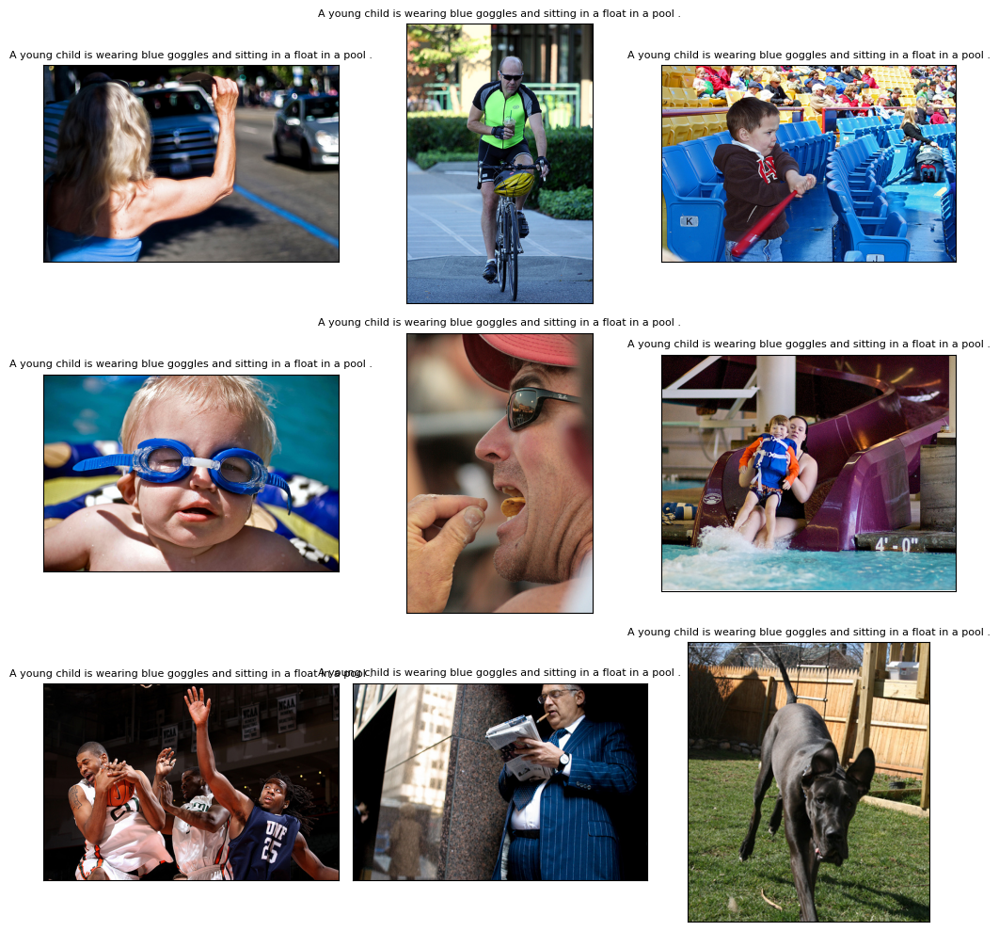

In [ ]:
# выводим 9 изображений
fig = plt.figure(figsize=(10,10))
for i in range(9):
    img_name = train_dataset.loc[i, 'image']
    img = Image.open(os.path.join(DATA_PATH, 'train_images', img_name))
    text = train_dataset.loc[i, 'query_text']
    fig.add_subplot(3, 3, i+1)
    plt.title(text, fontsize=8)
    plt.imshow(img)
# для компактности удаляем оси и прижимаем изображения друг к другу
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Очевидно, что далеко не все описания соответствуют картинкам. Количество объектов в `train_dataset` и`train_images` совпадает.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

In [ ]:
crowd_annotations = pd.read_csv(os.path.join(DATA_PATH, 'CrowdAnnotations.tsv'), sep='\t', names=['image_name', 'query_id', 'fit_ratio', 'fit_count', 'not_fit_count'])
crowd_annotations.sample(5)

,image_name,query_id,fit_ratio,fit_count,not_fit_count
15903,2648165716_02e2e74fd6.jpg,3549583146_3e8bb2f7e9.jpg#2,0.000000,0,3
36859,3540416981_4e74f08cbb.jpg,3474406285_01f3d24b71.jpg#2,0.333333,1,2
10110,2374652725_32f90fa15c.jpg,113678030_87a6a6e42e.jpg#2,0.000000,0,3
5414,2061144717_5b3a1864f0.jpg,448658518_eec0b648a6.jpg#2,0.000000,0,3
3161,1499581619_a5f65a882c.jpg,2603792708_18a97bac97.jpg#2,0.000000,0,3


Судя по случайным строкам, разметка с краудсорсинга, в основном, совпадает.

In [ ]:
crowd_annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   image_name     47830 non-null  object 
 1   query_id       47830 non-null  object 
 2   fit_ratio      47830 non-null  float64
 3   fit_count      47830 non-null  int64  
 4   not_fit_count  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


Данных в файле `crowd_annotations` гораздо больше, чем в тренировочном датасете. Возможно, в таблице есть дубликаты и объекты, отсутствующие в тренировочном датасете.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

In [ ]:
expert_annotations = pd.read_csv(os.path.join(DATA_PATH, 'ExpertAnnotations.tsv'), sep='\t', names=['image_name', 'query_id', 'expert_1', 'expert_2', 'expert_3'])
expert_annotations.sample(5)

,image_name,query_id,expert_1,expert_2,expert_3
576,180094434_b0f244832d.jpg,339658315_fbb178c252.jpg#2,1,1,1
1724,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,4,4,4
684,2061144717_5b3a1864f0.jpg,2662845514_8620aaee96.jpg#2,1,1,1
2695,2991994607_06f24ec7a6.jpg,3074842262_62b1b2168c.jpg#2,1,1,1
233,1348304997_afe60a61df.jpg,2718024196_3ff660416a.jpg#2,2,2,3


Судя по полученному результату разметки, выбрать вариант голосованием большинства будет не трудно.

In [ ]:
expert_annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_name  5822 non-null   object
 1   query_id    5822 non-null   object
 2   expert_1    5822 non-null   int64 
 3   expert_2    5822 non-null   int64 
 4   expert_3    5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


Далее переходим к тестовому датасету.

In [ ]:
test_images = pd.read_csv(os.path.join(DATA_PATH, 'test_images.csv'))
test_images.head()

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


In [ ]:
test_images.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes


In [ ]:
test_queries = pd.read_csv(os.path.join(DATA_PATH, 'test_queries.csv'), sep='|', index_col=0)
test_queries.head()

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


In [ ]:
test_queries.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


В файле `test_images.csv` содержится список фотографий для тестирования, в файле `test_queries.csv` - описания к тестовому датасету. Описаний больше, т.к. к каждой фотографии в нём имеется несколько альтернативных описаний.

В папке `test_images` содержатся изображения для тестирования модели.

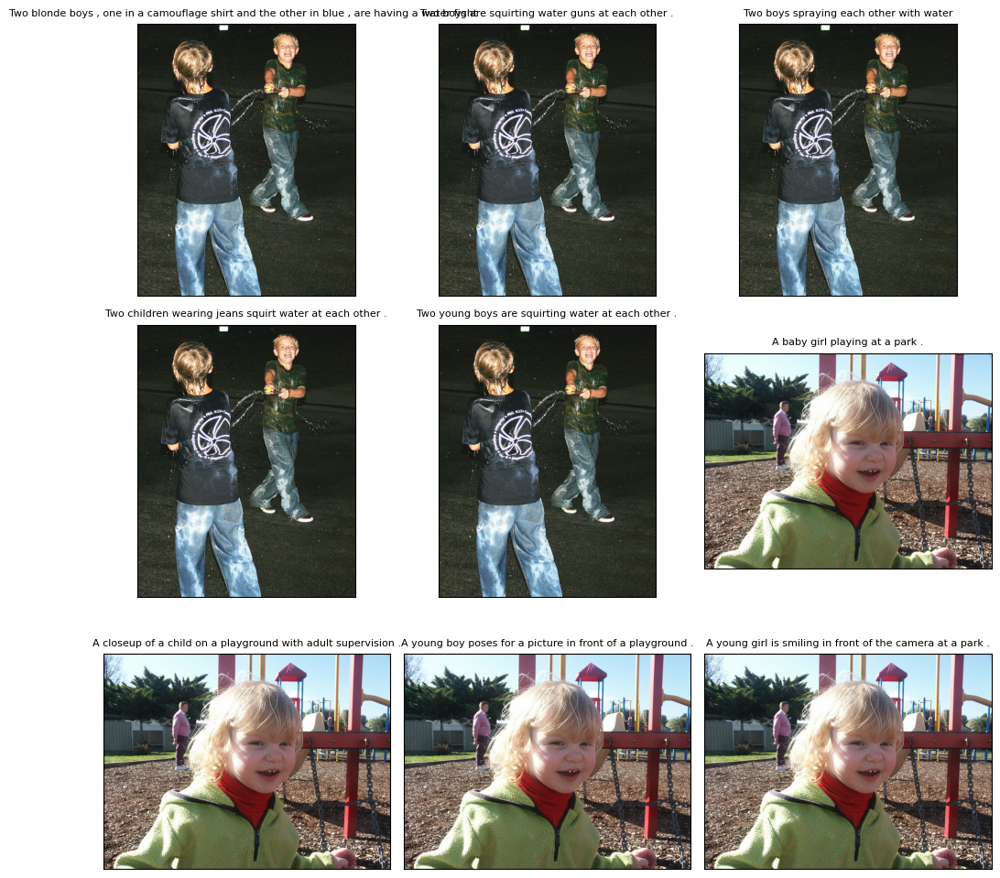

In [ ]:
# выводим 9 изображений
fig = plt.figure(figsize=(10,10))
for i in range(9):
    img_name = test_queries.loc[i, 'image']
    img = Image.open(os.path.join(DATA_PATH, 'test_images', img_name))
    text = test_queries.loc[i, 'query_text']
    fig.add_subplot(3, 3, i+1)
    plt.title(text, fontsize=8)
    plt.imshow(img)
# для компактности удаляем оси и прижимаем изображения друг к другу
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

В тестовом датасете правильная разметка.

## Предобработка данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи необходимо эти оценки агрегировать — превратить в одну. В качестве способа агрегации оценок используем голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. В случае, если все оценки разные, объект можно удалить из датасета.


In [ ]:
# проверим наличие дубликатов
expert_annotations.duplicated().sum()

0

In [ ]:
# функция для аггрегации оценок
def aggregate_expert_annotations(row):
    expert_1 = row['expert_1']
    expert_2 = row['expert_2']
    expert_3 = row['expert_3']

    if expert_1 != expert_2 != expert_3:
        expert = 0
    else:
        expert = round(np.mean([expert_1, expert_2, expert_3]))

    return expert

In [ ]:
expert_annotations['expert'] = expert_annotations.apply(aggregate_expert_annotations, axis=1)

In [ ]:
expert_annotations.head(5)

,image_name,query_id,expert_1,expert_2,expert_3,expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,1
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,1


In [ ]:
# посмотрим, сколько получилось нулей
expert_annotations.query('expert == 0')['expert'].count()

126

Поскольку количество нулей небольшое, можно безболезненно удалить из датасета.

In [ ]:
expert_annotations = expert_annotations.query('expert != 0')

Теперь можно удалить колонки с тремя экспертами, оставив только аггрегированную.

In [ ]:
expert_annotations = expert_annotations.drop(columns=['expert_1', 'expert_2', 'expert_3'])

In [ ]:
expert_annotations.head()

,image_name,query_id,expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1


Далее нам из оценки нужно получить значение вероятности того, что картинка соответствует описанию. Для получения вероятностей используем такую шкалу:
- 1 - 0.00
- 2 - 0.33
- 3 - 0.67
- 4 - 1.00

In [ ]:
expert_annotations['expert'] = expert_annotations['expert'].apply(lambda x: round(((x-1)/3), 2))

In [ ]:
expert_annotations.head()

,image_name,query_id,expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.00
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.00
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.00
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.33
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.00


В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

In [ ]:
crowd_annotations.sample(5)

,image_name,query_id,fit_ratio,fit_count,not_fit_count
19149,2862004252_53894bb28b.jpg,2876993733_cb26107d18.jpg#2,0.0,0,3
7475,2197275664_fabcf3424b.jpg,363617160_6cb0c723be.jpg#2,0.0,0,3
30604,3315616181_15dd137e27.jpg,2021613437_d99731f986.jpg#2,0.0,0,3
13443,2526041608_a9775ab8d7.jpg,3061481868_d1e00b1f2e.jpg#2,0.0,0,3
39380,3619416477_9d18580a14.jpg,3375070563_3c290a7991.jpg#2,0.0,0,3


In [ ]:
crowd_annotations.duplicated().sum()

0

По аналогии с экспертными оценками, объекты, в которых невозможно выбрать оценку голосованием большинства, будем удалять.

In [ ]:
# посмотрим количество объектов
crowd_annotations.query('fit_ratio == 0.5')['fit_ratio'].count()

27

Таких объектов немного, их действительно можно удалить.

In [ ]:
crowd_annotations = crowd_annotations.query('fit_ratio != 0.5')

В дальнейшем мы будем использовать только значение `fit_ratio` в качестве вероятности соответствия - значит, оставшиеся две колонки можно удалить.

In [ ]:
crowd_annotations = crowd_annotations.drop(columns=['fit_count', 'not_fit_count'])

In [ ]:
crowd_annotations.head()

,image_name,query_id,fit_ratio
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0


Дальше нужно объединить оценки с крауда и экспертные с тренировочным датасетом. Для этого потребуется переименовать колонку с картинками.

In [ ]:
train_dataset = train_dataset.rename(columns={'image': 'image_name'})

In [ ]:
# теперь объединим таблицу крауда с тренировочным датасетом, чтобы получить описания
crowd_data = crowd_annotations.merge(train_dataset, on=['query_id'], how='outer')

In [ ]:
crowd_data = crowd_data.rename(columns={'image_name_x': 'image_name'})
crowd_data = crowd_data[['image_name', 'query_id', 'query_text', 'fit_ratio']]
crowd_data.sample(1)

,image_name,query_id,query_text,fit_ratio
29038,820169182_f5e78d7d19.jpg,510531976_90bbee22a2.jpg#2,A man balances on his forearms while a child w...,0.0


In [ ]:
crowd_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 290771 entries, 0 to 290770
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   image_name  290771 non-null  object 
 1   query_id    290771 non-null  object 
 2   query_text  289662 non-null  object 
 3   fit_ratio   290771 non-null  float64
dtypes: float64(1), object(3)
memory usage: 11.1+ MB


In [ ]:
# теперь объединим таблицу экспертов с тренировочным датасетом, чтобы получить описания
expert_data = expert_annotations.merge(train_dataset, on=['query_id'], how='outer')
expert_data = expert_data.rename(columns={'image_name_x': 'image_name'})
expert_data = expert_data[['image_name', 'query_id', 'query_text', 'expert']]
expert_data.sample(1)

,image_name,query_id,query_text,expert
36286,311146855_0b65fdb169.jpg,2522297487_57edf117f7.jpg#2,a white woman in a green sweater holds a smili...,0.0


In [ ]:
expert_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49643 entries, 0 to 49642
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image_name  49643 non-null  object 
 1   query_id    49643 non-null  object 
 2   query_text  49643 non-null  object 
 3   expert      49643 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


In [ ]:
# объединим оценки крауда и экспертов
train_data = crowd_data.merge(expert_data, on=['image_name', 'query_id', 'query_text'], how='outer')

В случаях, где есть пропуски, достаточно, чтобы была хотя бы одна оценка, а там, где оценок две, экспертные будем принимать с коэффициентом 0.6, а крауда - с коэффициентом 0.4.

In [ ]:
train_data['fit_ratio'] = train_data['fit_ratio'].fillna(train_data['expert'])
train_data['expert'] = train_data['expert'].fillna(train_data['fit_ratio'])

In [ ]:
def agg_expert_and_crowd(row):
    fit_ratio = row['fit_ratio']
    expert = row['expert']
    target = ''

    target = round((fit_ratio * 0.4 + expert * 0.6), 2)

    return target

In [ ]:
train_data['target'] = train_data.apply(agg_expert_and_crowd, axis=1)

In [ ]:
train_data.isna().sum()

image_name       0
query_id         0
query_text    1109
fit_ratio        0
expert           0
target           0
dtype: int64

In [ ]:
# оставшиеся пропуски удалим
train_data = train_data.dropna()

In [ ]:
# удалим лишние колонки
train_data = train_data.drop(columns=['fit_ratio', 'expert'])

In [ ]:
train_data.duplicated().sum()

519530

In [ ]:
train_data = train_data.drop_duplicates()

In [ ]:
train_data.sample(5)

,image_name,query_id,query_text,target
551474,136886677_6026c622eb.jpg,317109978_cb557802e1.jpg#2,A brown dog hops over a fallen tree branch .,0.00
407326,2949982320_c704b31626.jpg,2292406847_f366350600.jpg#2,A man rows his boat below .,0.00
241953,512101751_05a6d93e19.jpg,2421446839_fe7d46c177.jpg#2,A small black and white dog jumps at a woman i...,0.00
166470,348380010_33bb0599ef.jpg,509778093_21236bb64d.jpg#2,A collie plays with a white ball in a field of...,0.67
466222,3245912109_fdeef6b456.jpg,3715469645_6d1dc019b3.jpg#2,Two women with black hair stand in front of pl...,0.00


In [ ]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50136 entries, 0 to 570774
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image_name  50136 non-null  object 
 1   query_id    50136 non-null  object 
 2   query_text  50136 non-null  object 
 3   target      50136 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


Т.к. модель должна возвращать на выходе вероятность соответствия изображения тексту, то целевая переменная должна иметь значения от 0 до 1.

Проверим разметку изображений.

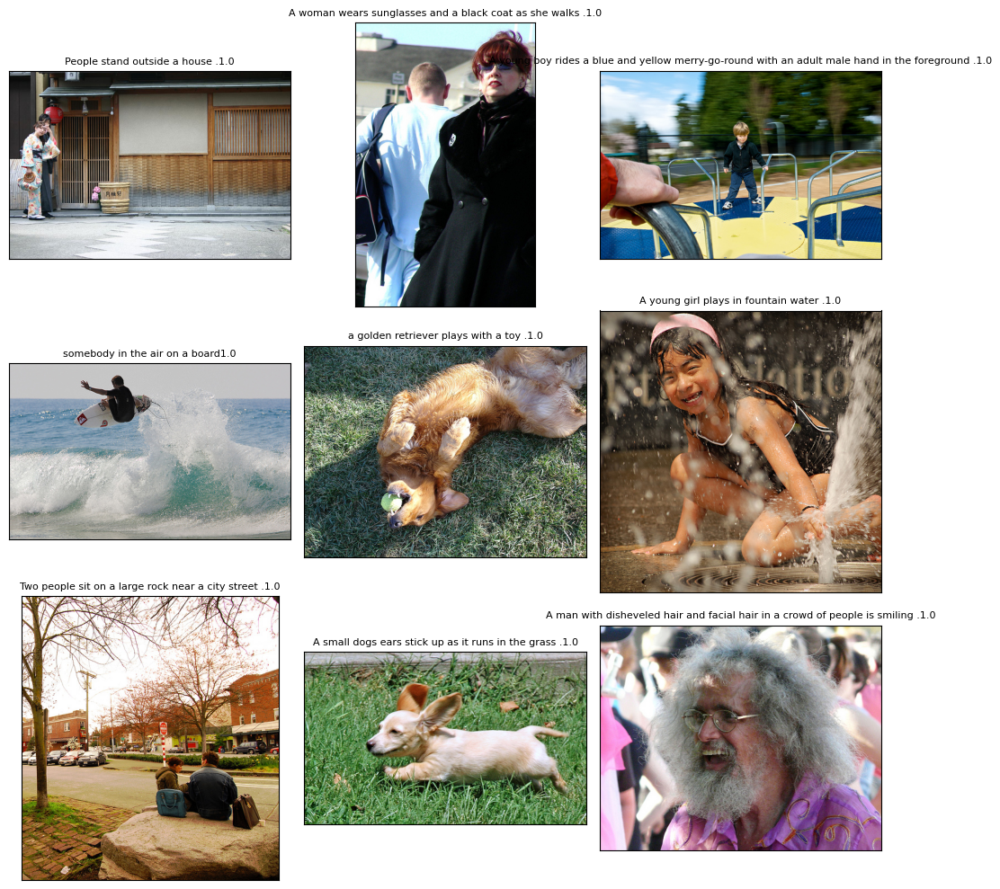

In [ ]:
ex = train_data.query('target == 1').sample(9).reset_index(drop=True)

# выводим 9 изображений
fig = plt.figure(figsize=(10,10))
for i in range(len(ex)):
    img_name = ex.loc[i,'image_name']
    img = Image.open(os.path.join(DATA_PATH, 'train_images', img_name))
    text = ex.loc[i, 'query_text']
    ann = str(ex.loc[i,'target'])
    fig.add_subplot(3, 3, i+1)
    plt.title(text+ann, fontsize=8)
    plt.imshow(img)
# для компактности удаляем оси и прижимаем изображения друг к другу
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Разметка не всегда адекватная, но более менее соответствует истине.

Поле `query_id` тоже содержит в себе имя файла. Нужно проверить описания в этим файлам.

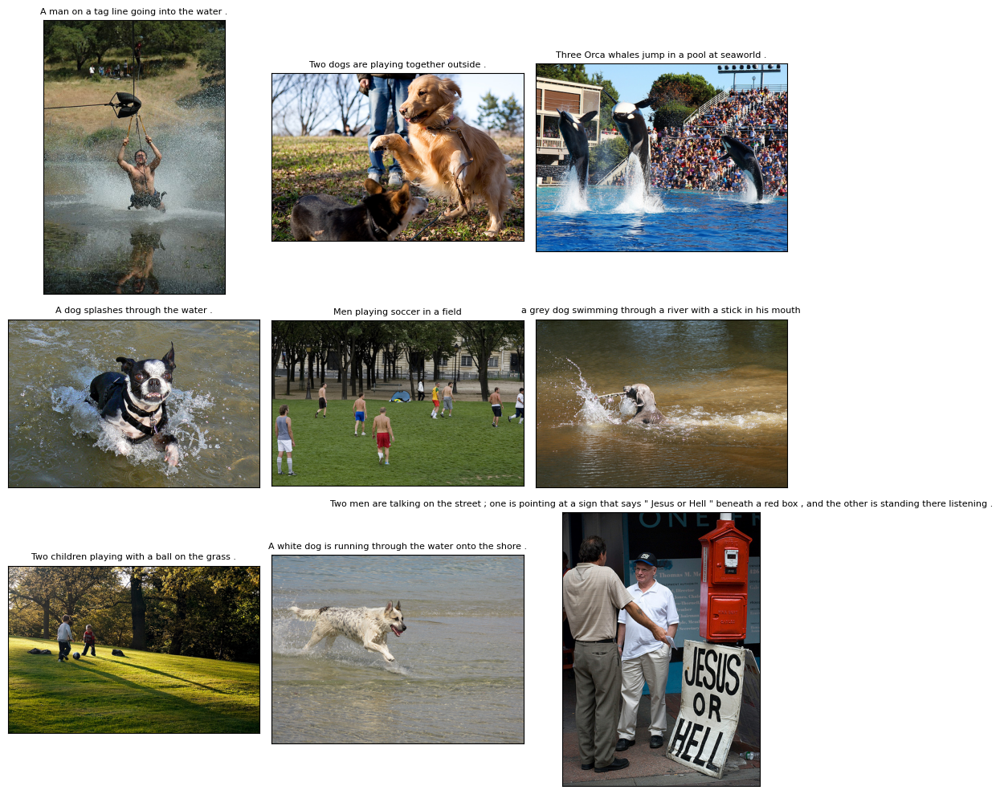

In [ ]:
ex = train_dataset.sample(9).reset_index(drop=True)

# выводим 9 изображений
fig = plt.figure(figsize=(10,10))
for i in range(len(ex)):
    img_name = ex.loc[i,'query_id'][:-2]
    img = Image.open(os.path.join(DATA_PATH, 'train_images', img_name))
    text = ex.loc[i, 'query_text']

    fig.add_subplot(3, 3, i+1)
    plt.title(text, fontsize=8)
    plt.imshow(img)
# для компактности удаляем оси и прижимаем изображения друг к другу
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Здесь все описания соответствуют картинкам. Значит, можно обогатить наш датасет картинками из `query_id` со значением таргета == 1.

In [ ]:
from_query = train_dataset.drop(columns=['image_name'])

In [ ]:
from_query['image_name'] = from_query['query_id'].apply(lambda x: x[:-2])

In [ ]:
from_query['target'] = 1

In [ ]:
from_query = from_query.drop_duplicates()

In [ ]:
from_query = from_query[['image_name', 'query_id', 'query_text', 'target']]
from_query.head()

,image_name,query_id,query_text,target
0,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1
12,2718495608_d8533e3ac5.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,1
22,3181701312_70a379ab6e.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,1
27,3207358897_bfa61fa3c6.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,1
31,3286822339_5535af6b93.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,1


In [ ]:
# теперь присоединим к train_data
train_data = pd.concat([train_data, from_query])

In [ ]:
train_data.head()

,image_name,query_id,query_text,target
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.0
1,2182488373_df73c7cc09.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",0.0
2,2594042571_2e4666507e.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",0.0
3,2843695880_eeea6c67db.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",0.0
4,2892995070_39f3c9a56e.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",0.0


In [ ]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51113 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image_name  51113 non-null  object 
 1   query_id    51113 non-null  object 
 2   query_text  51113 non-null  object 
 3   target      51113 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


## Проверка данных

В некоторых странах действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у нас нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

### Предобработка текста

Наиболее доступный вариант очищения данных от запрещённого контента - это опеределить слова в текстовых описаниях, которые могут указывать на такой контент, и удалить картинки с такими описаниями.

In [ ]:
# функция для добавления частеречного тега в лемматизаторе
def get_wordnet_pos(word):

    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)

# функция для предобработки текстов
def text_preprocessing(corpus):

    stop_words = stopwords.words('english')
    lemmatizer = WordNetLemmatizer() # инициализируем лемматизатор
    stop_words = stopwords.words('english') # задаём стоп-слова для очистки текстов от лишнего
    preprocessed = [] # создаём пустой список для записи обработанного текста
    for sentence in corpus:

        sentence = sentence.lower() # приводим к нижнему регистру
        sentence = re.sub(r'[^a-z]', ' ', sentence) # оставляем только латиницу
        sentence = list(lemmatizer.lemmatize(w, get_wordnet_pos(w)) for w in nltk.word_tokenize(sentence) if not w in stop_words) # токенизация и лемматизация предложения
        sentence = " ".join(sentence) # возвращаем в строку
        preprocessed.append(sentence)

    return preprocessed

In [ ]:
train_data['text'] = text_preprocessing(train_data['query_text'])

In [ ]:
train_data.head()

,image_name,query_id,query_text,target,text
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.0,woman signal traffic see behind
1,2182488373_df73c7cc09.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",0.0,woman signal traffic see behind
2,2594042571_2e4666507e.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",0.0,woman signal traffic see behind
3,2843695880_eeea6c67db.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",0.0,woman signal traffic see behind
4,2892995070_39f3c9a56e.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",0.0,woman signal traffic see behind


### Частотный анализ

Далее выполним частотный анализ слов в корпусе текстов. Для этого нам понадобится объединить все тексты в один.

In [ ]:
#  функция для объединения корпуса
def listmerge(corpus):
    all=[]
    for lst in corpus:
        all.extend(lst)
    return all

In [ ]:
tokenized_corpus = []
for sent in train_data['text']:
    tokenized_corpus.append(sent.split())

In [ ]:
merged_corpus = listmerge(tokenized_corpus) # объединяем корпус
merged_corpus = nltk.Text(merged_corpus) # преобразуем к классу Text
fdist = FreqDist(merged_corpus) # создаём экземпляр для частотного анализа

In [ ]:
# смотрим топ-15 самых часто встречаемых в корпусе текстов слов
fdist.most_common(15)

[('dog', 16147),
 ('man', 10126),
 ('two', 8681),
 ('white', 6725),
 ('girl', 5964),
 ('black', 5614),
 ('woman', 5423),
 ('boy', 5368),
 ('play', 5109),
 ('run', 4567),
 ('wear', 4441),
 ('stand', 4096),
 ('water', 3957),
 ('young', 3655),
 ('people', 3549)]

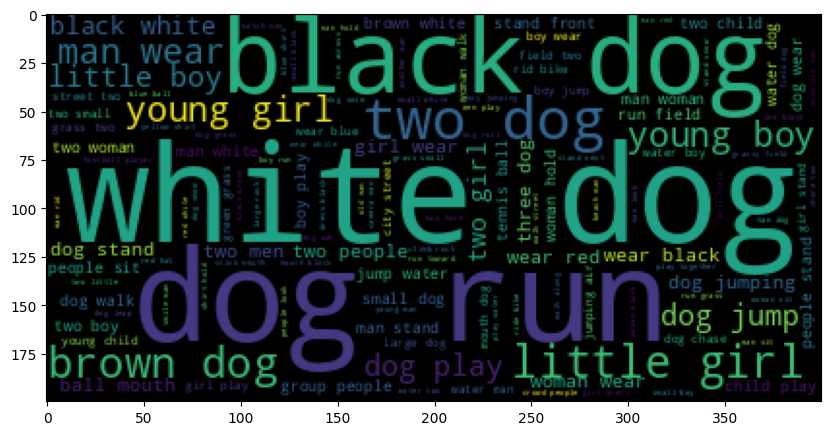

In [ ]:
# визуализируем облако слов
text_raw = " ".join(merged_corpus)
wordcloud = WordCloud().generate(text_raw)
plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.show()

Исходя из полученного облака слов, можно сделать вывод, что в корпусе текстов много собачек. А также, что от запрещённого контента помогут избавиться слова: "little boy", "little girl", "young girl", "young boy", "child", "children".

Однако, чтобы удалить картинку, нужно ещё учесть соответствие - удалять будем только в том случае, если картинка соответствует описанию с вероятностью более 0.5.

### Очистка от запрещённого контента

In [ ]:
# создадим список запрещённых слов
forbidden_words = ['little boy', 'little girl', 'young boy', 'young girl', 'child', 'children']

In [ ]:
# добавим метку к описаниям с этими словами
def forbidden_words_marker(text):
    for i in range(len(forbidden_words)):
        if forbidden_words[i] in text:
            return 1
    else: return 0

In [ ]:
train_data['marker'] = train_data['text'].apply(forbidden_words_marker)

In [ ]:
# доля запрещённых описаний
train_data.query('marker == 1 and target > 0.5')['marker'].count()/(train_data.shape[0])

0.0085692485277718

Менее 1% запрещённых описаний.

Чтобы получить список картинок с запрещёнными описаниями, нужно взять названия файлов из поля `query_id`.

In [ ]:
forbidden_images = train_data.query('marker == 1')['query_id'].apply(lambda x: x[:-2]).reset_index(drop=True)

In [ ]:
len(forbidden_images)

8159

In [ ]:
# функция для открытия картинок
def open_image(images_list):

    fig = plt.figure(figsize=(10,10))
    for i in range(len(images_list)):
        fig.add_subplot(int(np.ceil(len(images_list) / 4)), 4, i+1)
        img = Image.open(os.path.join(DATA_PATH, 'train_images' , images_list[i])).convert('RGB')
        plt.imshow(img)

        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()

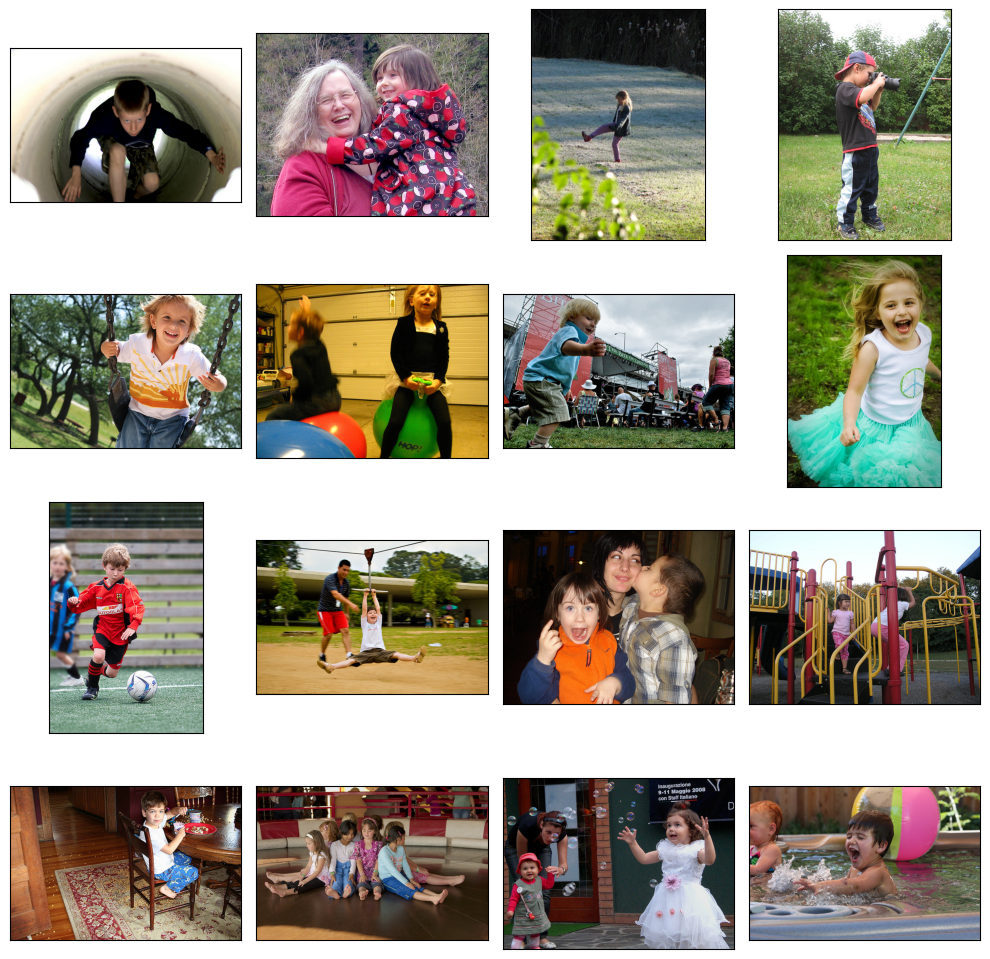

In [ ]:
# смотрим запрещённые картинки
open_image(forbidden_images.sample(16).reset_index(drop=True))

Запрещённый контент определён верно - значит, из тренировочного датасета нужно их удалить.

In [ ]:
train_data = train_data.query('image_name not in @forbidden_images')

In [ ]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43226 entries, 0 to 5821
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image_name  43226 non-null  object 
 1   query_id    43226 non-null  object 
 2   query_text  43226 non-null  object 
 3   target      43226 non-null  float64
 4   text        43226 non-null  object 
 5   marker      43226 non-null  int64  
dtypes: float64(1), int64(1), object(4)
memory usage: 2.3+ MB


In [ ]:
train_data.shape

(43226, 6)

In [ ]:
# сбросим индексы
train_data = train_data.reset_index(drop=True)

В тренировочной выборке в качестве целевого признака удобно иметь не только вероятности соответствия, но и бинарную классификацию. Поэтому добавим ещё одну колонку с бинарным таргетом.

In [ ]:
train_data['binary_target'] = train_data['target'].apply(lambda x: 1 if x >= 0.5 else 0)

In [ ]:
train_data.head(1)

,image_name,query_id,query_text,target,text,marker,binary_target
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.0,woman signal traffic see behind,0,1


In [ ]:
# исследуем баланс классов
train_data['binary_target'].value_counts()

0    39834
1     3392
Name: binary_target, dtype: int64

Выборка имеет сильный дисбаланс: картинок с соответствующим описанием очень мало.

## Downsampling

Т.к. выборка имеет дисбаланс по классам, мы можем уменьшить количество объектов нулевого класса.

In [ ]:
train_data.head(1)

,image_name,query_id,query_text,target,text,marker,binary_target
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.0,woman signal traffic see behind,0,1


In [ ]:
train_data_downsampled = train_data.drop(train_data.query('binary_target == 0').sample(frac=.9).index)

In [ ]:
train_data_downsampled = train_data_downsampled.reset_index(drop=True)

In [ ]:
train_data_downsampled.shape

(7375, 7)

In [ ]:
train_data_downsampled['binary_target'].value_counts()

0    3983
1    3392
Name: binary_target, dtype: int64

## Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [ ]:
#загружаем претренированную модель
resnet = models.resnet18(pretrained=True)

# замораживаем веса
for param in resnet.parameters():
    param.requires_grad_(False)

# берём слои, кроме последнего
modules = list(resnet.children())[:-1]
resnet = nn.Sequential(*modules)

# переводим модель в режим предсказания
resnet.eval()

# функция для нормализации изображений
norm = transforms.Normalize(
    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    norm,
])

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 306MB/s]


In [ ]:
def get_image_embeddings(image_names, filepath):
    image_embeddings = []

    for image_name in image_names:

        img = Image.open(os.path.join(filepath, image_name)).convert('RGB')
        image_tensor = preprocess(img).unsqueeze(0)
        output_tensor = resnet(image_tensor).flatten()
        image_embeddings.append(output_tensor.numpy())

    return image_embeddings

In [ ]:
# получение эмбеддингов изображений
image_embeddings = get_image_embeddings(train_data['image_name'], os.path.join(DATA_PATH, 'train_images'))

KeyboardInterrupt: ignored

In [ ]:
# получение эмбеддингов downsampled выборки
image_embeddings_downsampled = get_image_embeddings(train_data_downsampled['image_name'],
                                                    os.path.join(DATA_PATH, 'train_images'))

In [ ]:
len(image_embeddings_downsampled)

7375

## Векторизация текстов

In [ ]:
# загрузим предобученную модель
bert_model = ppb.AutoModel.from_pretrained('bert-base-uncased')
bert_tokenizer = ppb.AutoTokenizer.from_pretrained('bert-base-uncased')

In [ ]:
def get_text_features(corpus):

    # выполняем токенизацию
    tokenized = corpus.apply((lambda x: bert_tokenizer.encode(x, add_special_tokens=True, truncation=True)))

    # для векторов, длина которых меньше наибольшего вектора, добавляем отступы нулями
    max_len = 0
    for i in tokenized.values:
        if len(i) > max_len:
            max_len = len(i)

    padded = np.array([i + [0]*(max_len-len(i)) for i in tokenized.values])

    # создаём маску для важных токенов
    attention_mask = np.where(padded != 0, 1, 0)

    batch_size = 100  # эмбеддинги BERT создаёт батчами
    text_embeddings = []

    for i in notebook.tqdm(range(int(np.ceil(len(padded)/batch_size)))): # делаем цикл по батчам с отображением прогресса

        batch = torch.LongTensor(padded[batch_size*i : batch_size*(i+1)]) # преобразуем данные в тензоры
        attention_mask_batch = torch.LongTensor(attention_mask[batch_size*i : batch_size*(i+1)])

        with torch.no_grad(): # для ускорения вычислений укажем, что градиенты не нужны
            batch_embeddings = bert_model(batch, attention_mask=attention_mask_batch) # чтобы получить эмбеддинги для батча, передадим модели данные и маску

        text_embeddings.append(batch_embeddings[0][:, 0, :].numpy()) # из полученного тензора извлечём нужные элементы и добавим в список эмбеддингов

    text_features = np.concatenate(text_embeddings) # соберём все эмбеддинги в матрицу признаков

    return text_features

In [ ]:
text_features = get_text_features(train_data['query_text'])

In [ ]:
text_features_downsampled = get_text_features(train_data_downsampled['query_text'])

  0%|          | 0/74 [00:00<?, ?it/s]

In [ ]:
text_features_downsampled.shape

(7375, 768)

## Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [ ]:
features = np.hstack((np.array(image_embeddings), text_features))
features.shape

In [ ]:
features_downsampled = np.hstack((np.array(image_embeddings_downsampled), text_features_downsampled))
features_downsampled.shape

(7375, 1280)

Итак, мы получили признаки для обучения модели. Это матрица размерностью (7375, 1280) для downsampled выборки. 1280 - это результат конкатенации векторов изображений и текстов. Итоговый вектор включает в себя признаки и текстов, и изображений.

## Обучение модели предсказания соответствия

In [ ]:
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=features, y=train_data['target'], groups=train_data['image_name']))

train_df, test_df = features[train_indices], features[test_indices]

train_target = train_data.loc[train_indices, 'target']
test_target = train_data.loc[test_indices, 'target']

binary_train_target = train_data.loc[train_indices, 'binary_target']
binary_test_target = train_data.loc[test_indices, 'binary_target']

In [ ]:
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices_downsampled, test_indices_downsampled = next(gss.split(X=features_downsampled, y=train_data_downsampled['target'], groups=train_data_downsampled['image_name']))

train_df_downsampled, test_df_downsampled = features_downsampled[train_indices_downsampled], features_downsampled[test_indices_downsampled]

train_target_downsampled = train_data_downsampled.loc[train_indices_downsampled, 'target']
test_target_downsampled = train_data_downsampled.loc[test_indices_downsampled, 'target']

binary_train_target_downsampled = train_data_downsampled.loc[train_indices_downsampled, 'binary_target']
binary_test_target_downsampled = train_data_downsampled.loc[test_indices_downsampled, 'binary_target']

У нас задача бинарной классификации, поэтому для оценки модели выбираем метрику классификации. В этой задаче будем использовать ROC-AUC, т.к. она учитывает не только результаты классификации, но и вероятность предсказания всех классов.

### Логистическая регрессия

In [ ]:
logreg = LogisticRegression(random_state=12345, max_iter=1000)

In [ ]:
params = {
          'C':[.05],
          'penalty':['l1', 'l2'],
          'solver': ['lbfgs', 'liblinear', 'saga'],
          }

logreg_search = RandomizedSearchCV(logreg, params, cv=5, n_jobs=-1, scoring='roc_auc', verbose=0)

logreg_search.fit(train_df_downsampled, binary_train_target_downsampled)

In [ ]:
logreg_search.best_params_

In [ ]:
logreg_search.best_score_

In [ ]:
logreg = logreg_search.best_estimator_

In [ ]:
preds = logreg.predict(test_df_downsampled)

In [ ]:
np.sqrt(mean_squared_error(binary_test_target_downsampled, preds))

In [ ]:
tn, fp, fn, tp = confusion_matrix(binary_test_target_downsampled, preds).ravel()
tn, fp, fn, tp

Наилучшая метрика, которую удалось получить логистической регрессией AUC = 0.58. Из полученных результатов можно сделать вывод, что нулевой класс модель научилась распознавать чуть лучше.

### Нейросеть-классификатор

In [ ]:
# настроим раннюю остановку обучения для предотвращения переобучения
class EarlyStopping_1():
    """
    Early stopping to stop the training when the loss does not improve after
    certain epochs.
    """
    def __init__(self, patience=10, min_delta=0):
        """
        :param patience: how many epochs to wait before stopping when loss is
               not improving
        :param min_delta: minimum difference between new loss and old loss for
               new loss to be considered as an improvement
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False
    def __call__(self, val_loss):
        if self.best_loss == None:
            self.best_loss = val_loss
        elif self.best_loss - val_loss > self.min_delta:
            self.best_loss = val_loss
            # reset counter if validation loss improves
            self.counter = 0
        elif self.best_loss - val_loss < self.min_delta:
            self.counter += 1
            print(f"INFO: Early stopping counter {self.counter} of {self.patience}")
            if self.counter >= self.patience:
                print('INFO: Early stopping')
                self.early_stop = True

In [ ]:
# гиперпараметры нейросети
num_epochs = 200
batch_size = 1000
loss = nn.BCELoss()
learning_rate = 0.01
early_stopping = EarlyStopping_1()

In [ ]:
X_train_tensor = torch.from_numpy(train_df).float()
X_test_tensor = torch.from_numpy(test_df).float()

y_train_tensor = torch.from_numpy(np.array(binary_train_target)).float()
y_test_tensor = torch.from_numpy(np.array(binary_test_target)).float()

dataset_train = torch.utils.data.TensorDataset(X_train_tensor, y_train_tensor)
dataset_test = torch.utils.data.TensorDataset(X_test_tensor, y_test_tensor)


train_dataloader = DataLoader(dataset_train, batch_size=batch_size, shuffle=True,
                              num_workers=0)
test_dataloader = DataLoader(dataset_test, batch_size=batch_size, num_workers=0)

In [ ]:
class Basic_Net(nn.Module):
    def __init__(self, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons,
                 act_1, act_2, act_3):
        super(Basic_Net, self).__init__()
        self.layer1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
        self.activation1 = act_1
        self.layer2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
        self.activation2 = act_2
        self.layer3 = nn.Linear(n_hidden_neurons_2, n_out_neurons)
        self.activation3 = act_3

    def forward(self, x):
        x = self.layer1(x)
        x = self.activation1(x)
        x = self.layer2(x)
        x = self.activation2(x)
        x = self.layer3(x)
        x = self.activation3(x)

        return x

In [ ]:
# инициализация весов
def init_weights(layer):
    if type(layer) == nn.Linear:
        nn.init.xavier_uniform_(layer.weight)

In [ ]:
n_in_neurons = X_train_tensor.size(dim=1)
n_out_neurons = 1
n_hidden_neurons_1 = 20
n_hidden_neurons_2 = 10
act_1 = act_2 = nn.Tanh()
act_3 = nn.Sigmoid()

In [ ]:
basic_net = Basic_Net(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons,
                      act_1, act_2, act_3)
basic_net.apply(init_weights)
optimizer = torch.optim.Adam(basic_net.parameters(), lr=learning_rate)

In [ ]:
skorch_classifier = NeuralNetClassifier(module=basic_net,
                                      device='cuda',
                                      verbose=3,
                                      batch_size=batch_size,
                                      optimizer=torch.optim.Adam,
                                      max_epochs=2500,
                                      lr=learning_rate,
                                      train_split=ValidSplit(cv=5),
                                      criterion=nn.BCELoss,
                                      callbacks=[
                ('auc', EpochScoring(scoring='roc_auc', lower_is_better=False)),
                ('estoper', EarlyStopping(lower_is_better=False, monitor='roc_auc')),
            ],
                                     )

In [ ]:
def rlu(x):
    rlu = np.maximum(0,x) - np.maximum(1,x) + 1
    return rlu

In [ ]:
params = {
    'module__n_in_neurons': [n_in_neurons],
    'module__n_hidden_neurons_1': range(10, 30, 5),
    'module__n_hidden_neurons_2': range(10, 30, 5),
    'module__act_1': [nn.Tanh()],
    'module__act_2': [nn.Tanh()],
    'module__act_3': [nn.Sigmoid()],
    'module__n_out_neurons': [n_out_neurons],
    'lr': [1e-3, 1e-4],

}

In [ ]:
grid = RandomizedSearchCV(skorch_classifier, params, cv=3, scoring="roc_auc", verbose=3, random_state=42)
grid.fit(X_train_tensor, y_train_tensor.reshape(-1,1))

Fitting 3 folds for each of 10 candidates, totalling 30 fits
  epoch    roc_auc    train_loss    valid_acc    valid_loss     dur
-------  ---------  ------------  -----------  ------------  ------
      1     0.5401        0.6992       0.7036        0.6770  0.0474
      2     0.5595        0.6930       0.6277        0.6859  0.0484
      3     0.5769        0.6907       0.4672        0.6972  0.0472
      4     0.5903        0.6892       0.2964        0.7086  0.0476
      5     0.6006        0.6884       0.2394        0.7190  0.0493
      6     0.6100        0.6881       0.2204        0.7281  0.0485
      7     0.6157        0.6881       0.2131        0.7358  0.0581
      8     0.6206        0.6882       0.2102        0.7421  0.0477
      9     0.6237        0.6885       0.2102        0.7471  0.0466
     10     0.6274        0.6887       0.2102        0.7508  0.0477
     11     0.6305        0.6888       0.2102        0.7536  0.0477
     12     0.6338        0.6889       0.2102        0.

RandomizedSearchCV(cv=3,
                   estimator=<class 'skorch.classifier.NeuralNetClassifier'>[uninitialized](
  module=Basic_Net(
    (layer1): Linear(in_features=1280, out_features=20, bias=True)
    (activation1): Tanh()
    (layer2): Linear(in_features=20, out_features=10, bias=True)
    (activation2): Tanh()
    (layer3): Linear(in_features=10, out_features=1, bias=True)
    (activation3): Sigmoid()
  ),
),
                   param_distributions={'lr': [0.001, 0.0001],
                                        'module__act_1': [Tanh()],
                                        'module__act_2': [Tanh()],
                                        'module__act_3': [Sigmoid()],
                                        'module__n_hidden_neurons_1': range(10, 30, 5),
                                        'module__n_hidden_neurons_2': range(10, 30, 5),
                                        'module__n_in_neurons': [1280],
                                        'module__n_out_neurons': [1]},
                   random_state=42, scoring='roc_auc', verbose=3)

In [ ]:
grid.best_params_

{'module__n_out_neurons': 1,
 'module__n_in_neurons': 1280,
 'module__n_hidden_neurons_2': 10,
 'module__n_hidden_neurons_1': 20,
 'module__act_3': Sigmoid(),
 'module__act_2': Tanh(),
 'module__act_1': Tanh(),
 'lr': 0.001}

In [ ]:
grid.best_score_

0.5991659140959087

In [ ]:
basic_net = Basic_Net(n_in_neurons, 10, 20, n_out_neurons, act_1, act_2, act_3)
basic_net.apply(init_weights)
optimizer = torch.optim.Adam(basic_net.parameters(), lr=0.001)
num_epochs = 200

In [ ]:
for epoch in range(num_epochs):
    basic_net.train()
    for batch in train_dataloader:
        data_train, target_train = batch   # просто выгружаем данные
        optimizer.zero_grad()
        preds = basic_net.forward(data_train).flatten()
        loss_value = loss(preds, target_train)
        loss_value.backward()
        optimizer.step()

    if epoch % 10 == 0:
        predicted_temp = []
        with torch.no_grad():
            basic_net.eval()
            for batch in test_dataloader:
                data_test, target_test = batch # просто выгружаем данные

                test_preds = basic_net.forward(data_test).flatten()
                predicted_temp.append(test_preds)
                BCE_loss = loss(test_preds, target_test)

        predicted_temp = torch.cat(predicted_temp).detach().numpy()
        AUC = roc_auc_score(y_test_tensor, predicted_temp)
        early_stopping(AUC)
        print(f"epoch:{epoch}, AUC test: {AUC}")

        if early_stopping.early_stop:
            print('Early Stopping!!!')
            break

INFO: Early stopping counter 9 of 5
INFO: Early stopping
epoch:0, AUC test: 0.5137163840152965
Early Stopping!!!


In [ ]:
test_preds[:3]

### BatchNormalization

In [ ]:
class BN_Net(nn.Module):
    def __init__(self, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons,
                 act_1, act_2, act_3):
        super(BN_Net, self).__init__()
        self.layer1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
        self.bn1 = nn.BatchNorm1d(n_hidden_neurons_1)
        self.activation1 = act_1
        self.layer2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
        self.bn2 = nn.BatchNorm1d(n_hidden_neurons_2)
        self.activation2 = act_2
        self.layer3 = nn.Linear(n_hidden_neurons_2, n_out_neurons)
        self.activation3 = act_3

    def forward(self, x):
        x = self.layer1(x)
        x = self.bn1(x)
        x = self.activation1(x)
        x = self.layer2(x)
        x = self.bn2(x)
        x = self.activation2(x)
        x = self.layer3(x)
        x = self.activation3(x)

        return x

In [ ]:
# инициализация весов
def init_weights(layer):
    if type(layer) == nn.Linear:
        nn.init.xavier_uniform_(layer.weight)

In [ ]:
bn_net = BN_Net(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons,
                      act_1, act_2, act_3)
bn_net.apply(init_weights)
optimizer = torch.optim.Adam(bn_net.parameters(), lr=learning_rate)

In [ ]:
skorch_classifier_bn = NeuralNetClassifier(module=bn_net,
                                      device='cuda',
                                      verbose=3,
                                      batch_size=batch_size,
                                      optimizer=torch.optim.Adam,
                                      max_epochs=2500,
                                      lr=learning_rate,
                                      train_split=ValidSplit(cv=5),
                                      criterion=nn.BCELoss,
                                      callbacks=[
                ('auc', EpochScoring(scoring='roc_auc', lower_is_better=False)),
                ('estoper', EarlyStopping(lower_is_better=False, monitor='roc_auc')),
            ],
                                     )

In [ ]:
params = {
    'module__n_in_neurons': [n_in_neurons],
    'module__n_hidden_neurons_1': range(10, 30, 5),
    'module__n_hidden_neurons_2': range(10, 30, 5),
    'module__act_1': [nn.Tanh(), nn.ELU(), nn.ReLU(), nn.LeakyReLU()],
    'module__act_2': [nn.Tanh(), nn.ELU(), nn.ReLU(), nn.LeakyReLU()],
    'module__act_3': [nn.Sigmoid(), rlu],
    'module__n_out_neurons': [n_out_neurons],
    'lr': [1e-3, 1e-4],

}

In [ ]:
grid_bn = RandomizedSearchCV(skorch_classifier_bn, params, cv=3, scoring="roc_auc", verbose=3, random_state=42)
grid_bn.fit(X_train_tensor, y_train_tensor.reshape(-1,1))

Fitting 3 folds for each of 10 candidates, totalling 30 fits
  epoch    roc_auc    train_loss    valid_acc    valid_loss     dur
-------  ---------  ------------  -----------  ------------  ------
      1     0.7007        0.6340       0.9654        0.5642  0.2722
      2     0.7337        0.5548       0.9679        0.4902  0.2361
      3     0.7121        0.4980       0.9774        0.4173  0.2491
      4     0.7479        0.4553       0.9789        0.3742  0.2363
      5     0.7600        0.4214       0.9794        0.3391  0.5770
      6     0.7706        0.3941       0.9792        0.3147  0.2442
      7     0.7685        0.3718       0.9797        0.2949  0.2312
      8     0.7735        0.3533       0.9789        0.2736  0.2429
      9     0.7789        0.3375       0.9789        0.2534  0.2320
     10     0.7853        0.3241       0.9792        0.2383  0.2453
     11     0.7965        0.3119       0.9794        0.2121  0.2396
     12     0.7908        0.3011       0.9797        0.

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
15 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/skorch/classifier.py", line 143, in fit
    return super(NeuralNetClassifier, self).fit(X, y, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/skorch/net.py", line 1302, in fit
    self.partial_fit(X, y, **fit_params)
  File "/usr/local/lib/python3.10/dis

  epoch    roc_auc    train_loss    valid_acc    valid_loss     dur
-------  ---------  ------------  -----------  ------------  ------
      1     0.5876        0.4992       0.9497        0.4255  0.5721
      2     0.5918        0.4239       0.9499        0.3629  0.5479
      3     0.5776        0.3750       0.9499        0.3094  0.5320
      4     0.5862        0.3413       0.9499        0.2796  0.9532
      5     0.5959        0.3167       0.9499        0.2568  0.5428
      6     0.6014        0.2983       0.9499        0.2371  0.5333
      7     0.6143        0.2838       0.9499        0.2232  0.5498
      8     0.6181        0.2722       0.9499        0.2178  0.5488
      9     0.6373        0.2630       0.9499        0.2096  0.3631
     10     0.6516        0.2545       0.9499        0.2047  0.3543
     11     0.6706        0.2471       0.9499        0.2024  0.7111
     12     0.6690        0.2400       0.9499        0.2050  0.3653
     13     0.6868        0.2333       0.9499   

RandomizedSearchCV(cv=3,
                   estimator=<class 'skorch.classifier.NeuralNetClassifier'>[uninitialized](
  module=BN_Net(
    (layer1): Linear(in_features=1280, out_features=20, bias=True)
    (bn1): BatchNorm1d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation1): Tanh()
    (layer2): Linear(in_features=20, out_features=10, bias=True)
    (bn2): BatchNorm1d(10, ep...
                                                          LeakyReLU(negative_slope=0.01)],
                                        'module__act_2': [Tanh(),
                                                          ELU(alpha=1.0),
                                                          ReLU(),
                                                          LeakyReLU(negative_slope=0.01)],
                                        'module__act_3': [Sigmoid(),
                                                          <function rlu at 0x7f165f4c9630>],
                                        'module__n_hidden_neurons_1': range(10, 30, 5),
                                        'module__n_hidden_neurons_2': range(10, 30, 5),
                                        'module__n_in_neurons': [1280],
                                        'module__n_out_neurons': [1]},
                   random_state=42, scoring='roc_auc', verbose=3)

In [ ]:
grid_bn.best_params_

{'module__n_out_neurons': 1,
 'module__n_in_neurons': 1280,
 'module__n_hidden_neurons_2': 20,
 'module__n_hidden_neurons_1': 20,
 'module__act_3': Sigmoid(),
 'module__act_2': LeakyReLU(negative_slope=0.01),
 'module__act_1': Tanh(),
 'lr': 0.001}

In [ ]:
grid_bn.best_score_

0.6612138540682213

In [ ]:
bn_net = BN_Net(n_in_neurons, 20, 20, n_out_neurons, act_1, nn.LeakyReLU(), act_3)
bn_net.apply(init_weights)
optimizer = torch.optim.Adam(bn_net.parameters(), lr=0.001)
num_epochs = 200

In [ ]:
for epoch in range(num_epochs):
    bn_net.train()
    for batch in train_dataloader:
        data_train, target_train = batch   # просто выгружаем данные
        optimizer.zero_grad()
        preds = bn_net.forward(data_train).flatten()
        loss_value = loss(preds, target_train)
        loss_value.backward()
        optimizer.step()

    if epoch % 10 == 0:
        predicted_temp = []
        with torch.no_grad():
            bn_net.eval()
            for batch in test_dataloader:
                data_test, target_test = batch # просто выгружаем данные

                test_preds = bn_net.forward(data_test).flatten()
                predicted_temp.append(test_preds)
                BCE_loss = loss(test_preds, target_test)

        predicted_temp = torch.cat(predicted_temp).detach().numpy()
        AUC = roc_auc_score(y_test_tensor, predicted_temp)
        early_stopping(AUC)
        print(f"epoch:{epoch}, AUC test: {AUC}")

        if early_stopping.early_stop:
            print('Early Stopping!!!')
            break

epoch:0, AUC test: 0.5457632143555624
INFO: Early stopping counter 1 of 10
epoch:10, AUC test: 0.611137061297569
INFO: Early stopping counter 2 of 10
epoch:20, AUC test: 0.628170271321105
INFO: Early stopping counter 3 of 10
epoch:30, AUC test: 0.6321354840266715
INFO: Early stopping counter 4 of 10
epoch:40, AUC test: 0.6172568255649453
INFO: Early stopping counter 5 of 10
epoch:50, AUC test: 0.6212699028446005
INFO: Early stopping counter 6 of 10
epoch:60, AUC test: 0.6106308914086802
INFO: Early stopping counter 7 of 10
epoch:70, AUC test: 0.6022338065791754
INFO: Early stopping counter 8 of 10
epoch:80, AUC test: 0.6128490471600043
INFO: Early stopping counter 9 of 10
epoch:90, AUC test: 0.6048231751066117
INFO: Early stopping counter 10 of 10
INFO: Early stopping
epoch:100, AUC test: 0.6183734100264255
Early Stopping!!!


### Dropout

In [ ]:
class DP_Net(nn.Module):
    def __init__(self, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons,
                 act_1, act_2, act_3):
        super(DP_Net, self).__init__()
        self.layer1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
        self.activation1 = act_1
        self.dp1 = nn.Dropout(p=0.8)
        self.layer2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
        self.activation2 = act_2
        self.dp2 = nn.Dropout(p=0.8)
        self.layer3 = nn.Linear(n_hidden_neurons_2, n_out_neurons)
        self.activation3 = act_3

    def forward(self, x):
        x = self.layer1(x)
        x = self.activation1(x)
        x = self.dp1(x)
        x = self.layer2(x)
        x = self.dp2(x)
        x = self.activation2(x)
        x = self.layer3(x)
        x = self.activation3(x)

        return x

In [ ]:
dp_net = DP_Net(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons,
                      act_1, act_2, act_3)
dp_net.apply(init_weights)
optimizer = torch.optim.Adam(dp_net.parameters(), lr=learning_rate)

In [ ]:
skorch_classifier_dp = NeuralNetClassifier(module=dp_net,
                                      device='cuda',
                                      verbose=3,
                                      batch_size=batch_size,
                                      optimizer=torch.optim.Adam,
                                      max_epochs=2500,
                                      lr=learning_rate,
                                      train_split=ValidSplit(cv=5),
                                      criterion=nn.BCELoss,
                                      callbacks=[
                ('auc', EpochScoring(scoring='roc_auc', lower_is_better=False)),
                ('estoper', EarlyStopping(lower_is_better=False, monitor='roc_auc')),
            ],
                                     )

In [ ]:
params = {
    'module__n_in_neurons': [n_in_neurons],
    'module__n_hidden_neurons_1': range(10, 30, 5),
    'module__n_hidden_neurons_2': range(10, 30, 5),
    'module__act_1': [nn.Tanh()],
    'module__act_2': [nn.Tanh()],
    'module__act_3': [nn.Sigmoid()],
    'module__n_out_neurons': [n_out_neurons],
    'lr': [1e-3, 1e-4],

}

In [ ]:
grid_dp = RandomizedSearchCV(skorch_classifier_dp, params, cv=3, scoring="roc_auc", verbose=3, random_state=42)
grid_dp.fit(X_train_tensor, y_train_tensor.reshape(-1,1))

Fitting 3 folds for each of 10 candidates, totalling 30 fits
  epoch    roc_auc    train_loss    valid_acc    valid_loss     dur
-------  ---------  ------------  -----------  ------------  ------
      1     0.5790        0.6973       0.2234        0.7407  0.1806
      2     0.5804        0.6965       0.2365        0.7348  0.1959
      3     0.5836        0.7022       0.2423        0.7305  0.1921
      4     0.5875        0.6993       0.2599        0.7268  0.0923
      5     0.5914        0.6976       0.2642        0.7241  0.0817
      6     0.5943        0.6991       0.2657        0.7242  0.0903
      7     0.5979        0.6959       0.2642        0.7251  0.0903
      8     0.5999        0.6957       0.2584        0.7263  0.0756
      9     0.6024        0.6975       0.2569        0.7290  0.0921
     10     0.6059        0.6975       0.2394        0.7342  0.0925
     11     0.6088        0.6936       0.2277        0.7399  0.0744
     12     0.6110        0.6955       0.2234        0.

RandomizedSearchCV(cv=3,
                   estimator=<class 'skorch.classifier.NeuralNetClassifier'>[uninitialized](
  module=DP_Net(
    (layer1): Linear(in_features=1280, out_features=20, bias=True)
    (activation1): Tanh()
    (dp1): Dropout(p=0.8, inplace=False)
    (layer2): Linear(in_features=20, out_features=10, bias=True)
    (activation2): Tanh()
    (dp2): Dropout(p=0.8, inplace=False)
    (layer3): Linear(...=1, bias=True)
    (activation3): Sigmoid()
  ),
),
                   param_distributions={'lr': [0.001, 0.0001],
                                        'module__act_1': [Tanh()],
                                        'module__act_2': [Tanh()],
                                        'module__act_3': [Sigmoid()],
                                        'module__n_hidden_neurons_1': range(10, 30, 5),
                                        'module__n_hidden_neurons_2': range(10, 30, 5),
                                        'module__n_in_neurons': [1280],
                                        'module__n_out_neurons': [1]},
                   random_state=42, scoring='roc_auc', verbose=3)

In [ ]:
grid_dp.best_params_

{'module__n_out_neurons': 1,
 'module__n_in_neurons': 1280,
 'module__n_hidden_neurons_2': 10,
 'module__n_hidden_neurons_1': 10,
 'module__act_3': Sigmoid(),
 'module__act_2': Tanh(),
 'module__act_1': Tanh(),
 'lr': 0.001}

In [ ]:
grid_dp.best_score_

0.5737389139885576

In [ ]:
dp_net = DP_Net(n_in_neurons, 10, 10, n_out_neurons, act_1, act_2, act_3)
basic_net.apply(init_weights)
optimizer = torch.optim.Adam(basic_net.parameters(), lr=0.001)
num_epochs = 200

In [ ]:
for epoch in range(num_epochs):
    dp_net.train()
    for batch in train_dataloader:
        data_train, target_train = batch   # просто выгружаем данные
        optimizer.zero_grad()
        preds = dp_net.forward(data_train).flatten()
        loss_value = loss(preds, target_train)
        loss_value.backward()
        optimizer.step()

    if epoch % 10 == 0:
        predicted_temp = []
        with torch.no_grad():
            dp_net.eval()
            for batch in test_dataloader:
                data_test, target_test = batch # просто выгружаем данные

                test_preds = dp_net.forward(data_test).flatten()
                predicted_temp.append(test_preds)
                BCE_loss = loss(test_preds, target_test)

        predicted_temp = torch.cat(predicted_temp).detach().numpy()
        AUC = roc_auc_score(y_test_tensor, predicted_temp)
        early_stopping(AUC)
        print(f"epoch:{epoch}, AUC test: {AUC}")

        if early_stopping.early_stop:
            print('Early Stopping!!!')
            break

INFO: Early stopping counter 11 of 5
INFO: Early stopping
epoch:0, AUC test: 0.5073516985638618
Early Stopping!!!


### Вывод

Лучшие метрики, которые удалось получить каждой из моделей:
- Логистическая регрессия: AUC = 0.58
- Базовая нейросеть: AUC = 0.58
- Нейросеть с BatchNorm: AUC = 0.64
- Нейросеть с Dropout: AUC = 0.53

Таким образом, наиболее удачной оказалась нейросеть с BatchNorm, её и будем тестировать.

## 7. Тестирование модели

Для тестирования получим эмбеддинги для всех тестовых изображений из папки `test_images`, выберем случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведем наиболее релевантное изображение. Сравним визуально качество поиска.

In [ ]:
test_image_embeddings = get_image_embeddings(test_images['image'], os.path.join(DATA_PATH, 'test_images'))

In [ ]:
len(test_image_embeddings)

100

In [ ]:
text_samples = test_queries['query_text'].sample(10).reset_index(drop=True)

In [ ]:
text_samples

0    Woman in white bikini top and blue shorts with...
1                   Two dogs walking with their toys .
2                      A blue bird flying over water .
3    A little kid holds up a remote control in fron...
4    A man runs on a field with the ball and a man ...
5                          a bmx rider gets some air .
6     A group of people walk through a shopping mall .
7                      Person jumping into the water .
8    A little boy in a green soccer uniform is runn...
9    The woman with binoculars is sitting on the fo...
Name: query_text, dtype: object

In [ ]:
test_text_features = get_text_features(text_samples)

  0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
test_text_features.shape

(10, 768)

In [ ]:
features = pd.DataFrame(columns=['image', 'text', 'embedding'])
embeddings = []

for i in range(len(text_samples)):
    for j in range(len(test_image_embeddings)):

        f = np.hstack((test_text_features[i], test_image_embeddings[j]))
        row = [test_images.loc[j,'image'], text_samples[i], f]
        features.loc[ len(features.index )] = row
        embeddings.append(f)

In [ ]:
features.head()

,image,text,embedding
0,3356748019_2251399314.jpg,Woman in white bikini top and blue shorts with...,"[-0.3444352, -0.52084917, -0.57859826, 0.08900..."
1,2887171449_f54a2b9f39.jpg,Woman in white bikini top and blue shorts with...,"[-0.3444352, -0.52084917, -0.57859826, 0.08900..."
2,3089107423_81a24eaf18.jpg,Woman in white bikini top and blue shorts with...,"[-0.3444352, -0.52084917, -0.57859826, 0.08900..."
3,1429546659_44cb09cbe2.jpg,Woman in white bikini top and blue shorts with...,"[-0.3444352, -0.52084917, -0.57859826, 0.08900..."
4,1177994172_10d143cb8d.jpg,Woman in white bikini top and blue shorts with...,"[-0.3444352, -0.52084917, -0.57859826, 0.08900..."


In [ ]:
test_tensor = torch.from_numpy(np.array(embeddings)).float()

In [ ]:
test_preds = bn_net.forward(test_tensor).flatten()

In [ ]:
pd.Series(test_preds.detach().numpy())

0      3.348829e-11
1      9.999967e-01
2      1.028749e-02
3      9.239253e-01
4      5.250622e-02
           ...     
995    3.977407e-06
996    1.365525e-05
997    9.999838e-01
998    9.999925e-01
999    9.983928e-01
Length: 1000, dtype: float32

In [ ]:
features['prediction_proba'] = pd.Series(test_preds.detach().numpy())

In [ ]:
features.head()

,image,text,embedding,prediction_proba
0,3356748019_2251399314.jpg,Woman in white bikini top and blue shorts with...,"[-0.3444352, -0.52084917, -0.57859826, 0.08900...",3.348829e-11
1,2887171449_f54a2b9f39.jpg,Woman in white bikini top and blue shorts with...,"[-0.3444352, -0.52084917, -0.57859826, 0.08900...",9.999967e-01
2,3089107423_81a24eaf18.jpg,Woman in white bikini top and blue shorts with...,"[-0.3444352, -0.52084917, -0.57859826, 0.08900...",1.028749e-02
3,1429546659_44cb09cbe2.jpg,Woman in white bikini top and blue shorts with...,"[-0.3444352, -0.52084917, -0.57859826, 0.08900...",9.239253e-01
4,1177994172_10d143cb8d.jpg,Woman in white bikini top and blue shorts with...,"[-0.3444352, -0.52084917, -0.57859826, 0.08900...",5.250622e-02


In [ ]:
df = features.copy()

In [ ]:
df = df.reset_index()

In [ ]:
best = df.groupby('text')['prediction_proba'].max().reset_index()

In [ ]:
best

,text,prediction_proba
0,A blue bird flying over water .,0.999999
1,A group of people walk through a shopping mall .,0.999999
2,A little boy in a green soccer uniform is runn...,0.999997
3,A little kid holds up a remote control in fron...,0.999996
4,A man runs on a field with the ball and a man ...,0.999977
5,Person jumping into the water .,0.999920
6,The woman with binoculars is sitting on the fo...,0.999998
7,Two dogs walking with their toys .,0.999998
8,Woman in white bikini top and blue shorts with...,0.999999
9,a bmx rider gets some air .,0.999995


In [ ]:
result = df.merge(best, on=['text', 'prediction_proba'])

In [ ]:
result

,index,image,text,embedding,prediction_proba
0,54,2714674623_8cd05ac114.jpg,Woman in white bikini top and blue shorts with...,"[-0.3444352, -0.52084917, -0.57859826, 0.08900...",0.999999
1,154,2714674623_8cd05ac114.jpg,Two dogs walking with their toys .,"[-0.28172797, -0.19972396, -0.863329, 0.328988...",0.999998
2,277,973827791_467d83986e.jpg,A blue bird flying over water .,"[-0.5683174, -0.34253904, -0.7499449, 0.301221...",0.999999
3,354,2714674623_8cd05ac114.jpg,A little kid holds up a remote control in fron...,"[0.08257045, 0.5716418, -0.27805847, -0.239210...",0.999996
4,398,2670637584_d96efb8afa.jpg,A little kid holds up a remote control in fron...,"[0.08257045, 0.5716418, -0.27805847, -0.239210...",0.999996
5,454,2714674623_8cd05ac114.jpg,A man runs on a field with the ball and a man ...,"[-0.18684126, 0.40987578, -0.5315566, 0.234826...",0.999977
6,554,2714674623_8cd05ac114.jpg,a bmx rider gets some air .,"[0.024106268, -0.14363964, -0.21346888, 0.2963...",0.999995
7,685,3398788809_25c71ba018.jpg,A group of people walk through a shopping mall .,"[0.49976626, 0.35447982, -0.37642103, -0.15222...",0.999999
8,754,2714674623_8cd05ac114.jpg,Person jumping into the water .,"[-0.7574559, -0.3484019, -0.34740898, 0.350173...",0.999920
9,854,2714674623_8cd05ac114.jpg,A little boy in a green soccer uniform is runn...,"[0.12267047, 0.34775624, -0.37515497, -0.08028...",0.999997


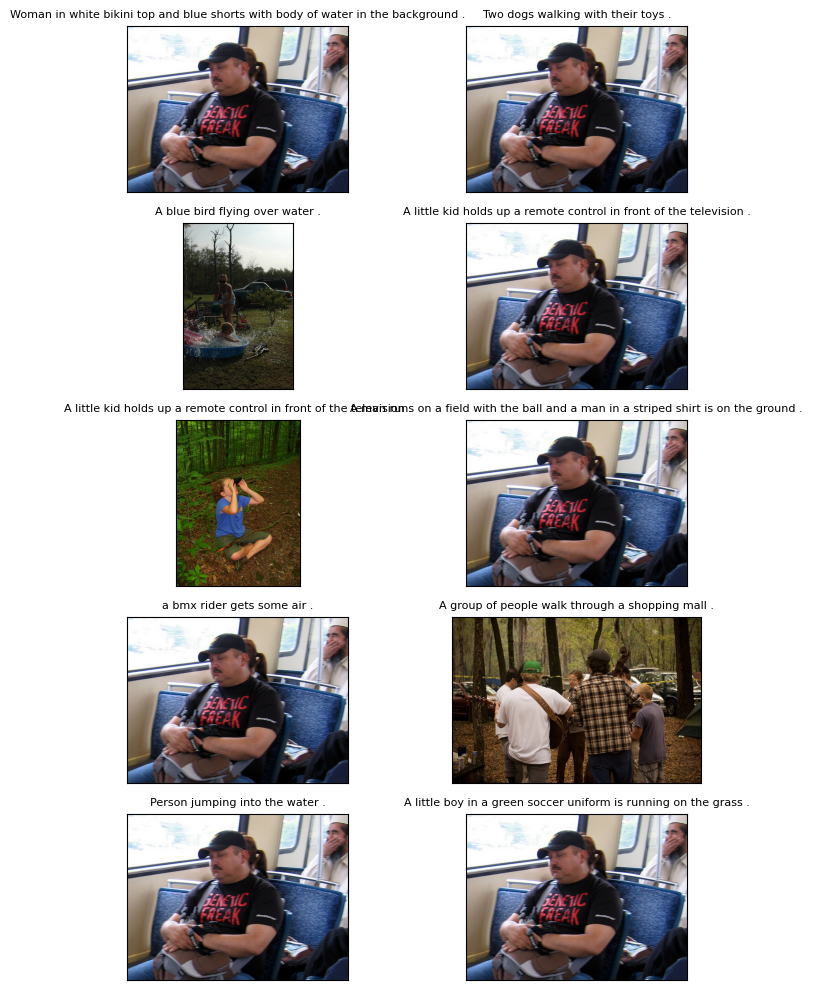

In [ ]:
# выводим изображения с описанием
fig = plt.figure(figsize=(10,10))
for i in range(10):
    img_name = result.loc[i, 'image']
    img = Image.open(os.path.join(DATA_PATH, 'test_images', img_name))
    text = result.loc[i, 'text']
    fig.add_subplot(5, 2, i+1)
    plt.title(text, fontsize=8)
    plt.imshow(img)
# для компактности удаляем оси и прижимаем изображения друг к другу
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

## Общий вывод

Данный подход с объединением векторов изображений и текста не подходит для успешного решения задачи. Модель не научилась распознавать соответствия. Возможно, для этой задачи стоит поискать более удачное решение.